<a href="https://colab.research.google.com/github/ingoscargiraldor/CDA_2/blob/main/RegresionLinealBM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Regresion lineal para modelos de machine learning

# Oscar Duvan Giraldo Romero - MATI 202324939
MINE-4101: Applied Data Science  
Univerisdad de los Andes  

**Business Context:** El Banco Mundial es una organización internacional que se dedica a brindar apoyo
financiero y técnico a países en desarrollo mediante préstamos para proyectos de
infraestructura, sectoriales, institucionales, entre otros, buscando mejorar el bienestar
económico y social de su población. El diseño de políticas de préstamos más informadas y
adaptadas a las necesidades y realidades de cada país, no solo maximiza la probabilidad de
que los préstamos sean reembolsados en su totalidad, sino que también asegura que los
fondos se utilicen de manera efectiva en las necesidades reales del territorio.
Históricamente, el Producto Interno Bruto (PIB) ha sido uno de los indicadores clave para
evaluar la capacidad de pago de un país. Sin embargo, si bien existen reportes anuales del
PIB de los países, aún no se entiende a la perfección con qué otros indicadores como tasa
de empleo, acceso a internet, expectativa de vida, entre otros, se encuentra relacionado.

Last update: October, 2023

**Dataset:**

•	country: Unique Identifier

•	incomeperperson: 2010 Gross Domestic Product per capita in constant 2000 US$. The inflation but not the differences in the cost of living between countries has been taken into account.

•	alcconsumption: 2008 Alcohol consumption per adult (age 15+), litres Recorded and estimated average alcohol consumption, adult (15+) per capita consumption in litres pure alcohol

•	armedforcesrate: Armed forces personnel (% of the total labour force)

•	breastcancerper100TH: 2002 breast cancer new cases per 100,000 females. Number of new cases of breast cancer in 100,000 female residents during a certain year.

•	co2emissions: 2006 cumulative CO2 emission (metric tons), Total amount of CO2 emission in metric tons since 1751.

•	femaleemployrate: 2007 female employees age 15+ (% of the population). Percentage of female population, age above 15, that has been employed during the given year.

•	HIVrate: 2009 estimated HIV Prevalence % - (Ages 15-49). Estimated number of people living with HIV per 100 population of age group 15-49.

•	Internetuserate: 2010 Internet users (per 100 people). Internet users are people with access to the worldwide network.

•	lifeexpectancy: 2011 life expectancy at birth (years). The average number of years a newborn child would live if current mortality patterns were to stay the same.

•	oilperperson: 2010 oil Consumption per capita (tonnes per year and person).

•	polityscore: 2009 Democracy score (Polity).Overall polity score from the Polity IV dataset, calculated by subtracting an autocracy score from a democracy score. The summary measure of a country's democratic and free nature. -10 is the lowest value, 10 the highest.

•	relectricperperson 2008 residential electricity consumption, per person (kWh). The amount of residential electricity consumption per person during the given year, counted in kilowatt-hours (kWh).

•	suicideper100TH: Suicide, age-adjusted, per 100,000 Mortality due to self-inflicted injury, per 100,000 standard population, age-adjusted.

•	employrate: 2007 total employees age 15+ (% of the population). Percentage of the total p population, age above 15, that has been employed during the given year.

•	urbanrate: Urban population (% of total) Urban population refers to people living in urban areas as defined by national statistical offices (calculated using World Bank population estimates and urban ratios from the United Nations World Urbanization Prospects)


In [ ]:
!pip install ydata_profiling

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from ydata_profiling import ProfileReport

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 17.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=8fe697c7ad45ba51ae32d8af0abdc1081e1ea7cb93bb648573afdc03b0663c8d
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
# Pandas configuration for extending the number of columns and rows to show
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

## Cargando los datos

In [ ]:
# Loading the CSV file as dataframe
gapminder_df = pd.read_csv("./data/gapminder_final.csv")

In [ ]:
# Showing dataframe dimensions
gapminder_df.shape

(178, 16)

In [ ]:
# Showing column types
gapminder_df.dtypes

country                  object
incomeperperson         float64
alcconsumption          float64
armedforcesrate         float64
breastcancerper100th    float64
co2emissions            float64
femaleemployrate        float64
hivrate                 float64
internetuserate         float64
lifeexpectancy          float64
oilperperson            float64
polityscore             float64
relectricperperson      float64
suicideper100th         float64
employrate              float64
urbanrate               float64
dtype: object

In [ ]:
gapminder_df.sample(6)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
47,Armenia,1326.741757,13.66,2.618438,51.6,5.121967e+07,34.200001,0.10,44.001025,74.241,NaN,5.0,603.763058,3.741588,40.099998,63.86
28,Lesotho,495.734247,5.56,0.217653,13.1,NaN,49.799999,23.60,3.860565,48.196,NaN,8.0,NaN,7.858619,56.299999,25.46
71,Mongolia,772.933345,3.41,1.211869,6.6,3.009343e+08,50.900002,0.06,12.900005,68.498,NaN,10.0,303.805449,13.089616,52.099998,57.18
6,Mauritania,609.131206,0.11,1.551262,28.1,5.681867e+07,45.299999,0.70,2.999803,58.582,NaN,-2.0,NaN,6.882952,46.900002,41.00
16,Kenya,468.696044,3.88,0.159574,25.2,2.835837e+08,66.599998,6.30,25.899797,57.134,NaN,7.0,41.180003,10.937718,73.199997,21.60
85,Morocco,1844.351028,1.24,2.085853,22.5,9.530510e+08,22.200001,0.10,49.000632,72.150,NaN,-6.0,209.094517,2.109414,46.200001,56.02


In [ ]:
profile = ProfileReport(gapminder_df)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 1. Analisis exploratorio Univariado

# Analisis de producto interno bruto, "incomeperperson"

In [ ]:
gapminder_df["incomeperperson"].nunique()

163

In [ ]:
gapminder_df["incomeperperson"].max()

52301.58718

In [ ]:
gapminder_df["incomeperperson"].min()

103.7758572

El valor Minimo de PIB presenta que la diferencia a nivel de los paises es grande en cuanto a la distribución o generación de este factor que impactara la decisión del banco mundial

In [ ]:
gapminder_df["incomeperperson"].value_counts(dropna=False, normalize=True)

NaN             0.016854
27595.091350    0.011236
52301.587180    0.011236
5184.709328     0.011236
279.180453      0.011236
                  ...   
27110.731590    0.005618
561.708585      0.005618
558.062877      0.005618
1200.652075     0.005618
37491.179520    0.005618
Name: incomeperperson, Length: 164, dtype: float64

In [ ]:
gapminder_df["incomeperperson"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count      175.000000
mean      7553.392250
std      11074.571742
min        103.775857
5%         241.729899
25%        609.744287
50%       2425.471293
75%       8880.432039
95%      32954.632381
max      52301.587180
Name: incomeperperson, dtype: float64

La mayor distribución de valores se da en un valor de 8000 lo que representa valores muy grandes a esto como valores atipicos que pueden impactar el entrenamiento del modelo.

In [ ]:
q1 = gapminder_df["incomeperperson"].quantile(0.25)
q3 = gapminder_df["incomeperperson"].quantile(0.75)
iqr = q3 - q1

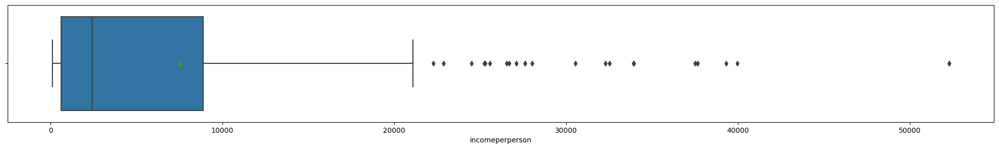

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["incomeperperson"] < (q1 - 1.5 * iqr)) | (gapminder_df["incomeperperson"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["incomeperperson"], showmeans=True, orient='h')

plt.show()


los valores por encima de 20000 se consideran atipicos para la solución, se corroborara al finalizar el EDA si es necesario imputarlos, debido al tamaño del dataset no es recomendable eliminar datos.

# Analisis de pais, "Country"

In [ ]:
# describing the variable values
gapminder_df["country"].unique()

array(['Ireland', 'Albania', 'Central African Rep.', 'Barbados', 'Italy',
       'Switzerland', 'Mauritania', 'Oman', 'Tanzania', 'Thailand',
       'Haiti', 'Equatorial Guinea', 'Guatemala', 'Iraq', 'Mali',
       'Bolivia', 'Kenya', 'Panama', 'Macedonia, FYR', 'Austria', 'Fiji',
       'Cuba', 'Azerbaijan', 'Korea, Rep.', 'Nicaragua', 'Lithuania',
       'Saudi Arabia', 'Belarus', 'Lesotho', 'Cape Verde', 'Eritrea',
       'Uganda', 'South Africa', 'Gabon', 'Georgia', 'Estonia',
       'Argentina', 'Cambodia', 'Suriname', 'Gambia', 'Japan',
       'Mozambique', 'Norway', 'Angola', 'Yemen, Rep.', 'Armenia',
       'Costa Rica', 'Turkey', 'Moldova', 'Pakistan', 'Vietnam', 'Spain',
       'Syria', 'Uzbekistan', 'Swaziland', 'Croatia', 'Solomon Islands',
       'Ghana', 'Finland', 'Senegal', 'Bangladesh', 'Guyana', 'Ethiopia',
       'Russia', 'Israel', 'Malaysia', 'Kuwait', 'Malta', 'Ecuador',
       'Mongolia', 'Kyrgyzstan', 'Germany', 'Rwanda', 'China', 'Burundi',
       'Slovak Repub

In [ ]:
gapminder_df["country"].nunique()

166

la variable Country muestra que cada uno de sus valores esta presente en mas de un 90% del dataset, hasta un 166 de veces.

In [ ]:
gapminder_df["country"].value_counts(dropna=False, normalize=True)

Ireland          0.011236
Luxembourg       0.011236
Malaysia         0.011236
Belarus          0.011236
Tajikistan       0.011236
                   ...   
Bangladesh       0.005618
Guyana           0.005618
Ethiopia         0.005618
Russia           0.005618
United States    0.005618
Name: country, Length: 166, dtype: float64

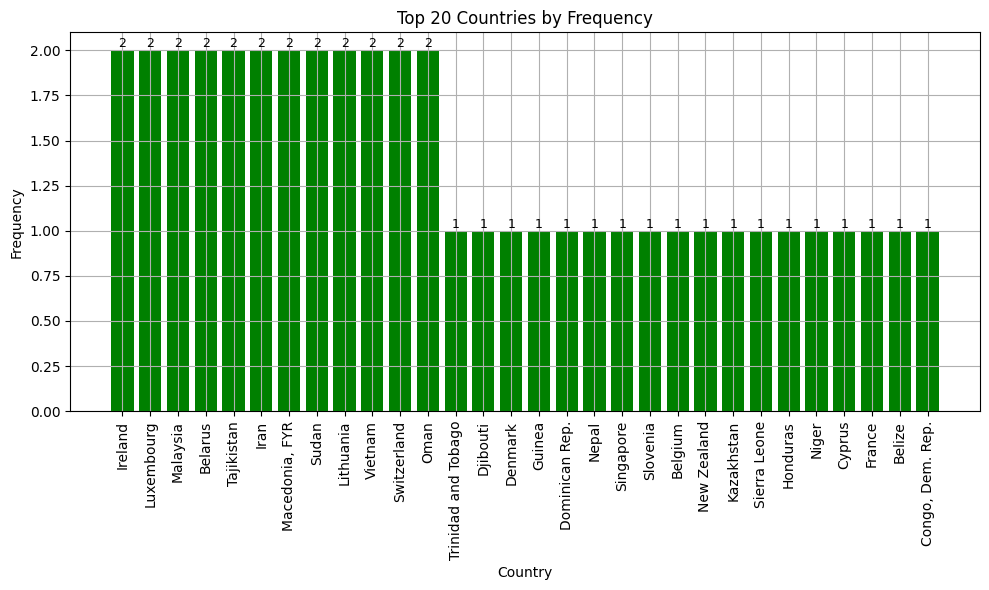

In [ ]:
# Calcular la frecuencia de las categorías
country_frequencies = gapminder_df["country"].value_counts()

# Tomar los primeros 20 valores de frecuencia
country_top20 = country_frequencies.head(30)

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
bars = plt.bar(country_top20.index, country_top20.values, color='green')
plt.xlabel('Country')
plt.ylabel('Frequency')
plt.title('Top 20 Countries by Frequency')
plt.xticks(rotation=90)
plt.grid(True)

# Agregar los valores a las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

De acuerdo con la frecuencia tenemos 12 datos duplicados sobre la variable de pais la cual debe ser revisada y limpiada.

# Analisis de uso de internet, "internetuserate"

In [ ]:
gapminder_df["internetuserate"].nunique()

163

Con el analisis de valores sobre el dataset se visualiza que se cuentan con algunos valores iguales para ciertos paises.

In [ ]:
gapminder_df["internetuserate"].max()

95.63811321

In [ ]:
gapminder_df["internetuserate"].min()

0.210066326

Cualquier pais presente con un PIB tiene un porcentaje en el uso de internet,hoy por hoy, el acceso a información y desarrollo de tecnologia esta basado en la investigación que pueda ofrecer el internet

In [ ]:
gapminder_df["internetuserate"].value_counts(dropna=False, normalize=True)

NaN          0.022472
69.770394    0.011236
90.079527    0.011236
32.052144    0.011236
56.300034    0.011236
               ...   
15.999650    0.005618
3.700003     0.005618
29.879921    0.005618
0.749996     0.005618
74.247572    0.005618
Name: internetuserate, Length: 164, dtype: float64

Revisando la frecuencia de los datos se encuentra que tenemos un 2.2% de valores vacios que se deben revisar para la metodologia de imputación de valores.

In [ ]:
gapminder_df["internetuserate"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count    174.000000
mean      34.740125
std       28.088371
min        0.210066
5%         1.700015
25%        9.924668
50%       29.939930
75%       55.973228
95%       83.607776
max       95.638113
Name: internetuserate, dtype: float64

In [ ]:
q1 = gapminder_df["internetuserate"].quantile(0.25)
q3 = gapminder_df["internetuserate"].quantile(0.75)
iqr = q3 - q1

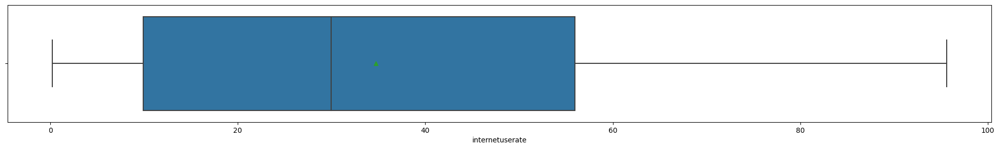

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["internetuserate"] < (q1 - 1.5 * iqr)) | (gapminder_df["internetuserate"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["internetuserate"], showmeans=True, orient='h')

plt.show()


la distribución del procentaje de uso de internet es constante sin presentar valores anomalos o atipicos, variable de alta congruencia para entrenar el modelo.

# Analisis esperanza de vida, "lifeexpectancy"

In [ ]:
gapminder_df["lifeexpectancy"].nunique()

164

Con el analisis de valores sobre el dataset se visualiza que se cuentan con algunos valores iguales para ciertos paises.

In [ ]:
gapminder_df["lifeexpectancy"].max()

83.394

In [ ]:
gapminder_df["lifeexpectancy"].min()

47.794

La esperanza de vida para el año 2011 deacuerdo a las pautas nos arroja que el minimo años de vida es 47.7 años y el maximo que se logra obtener es de 83.9 años de vida.

In [ ]:
gapminder_df["lifeexpectancy"].value_counts(dropna=False, normalize=True)

72.974    0.022472
80.557    0.011236
61.452    0.011236
75.181    0.011236
67.529    0.011236
            ...   
59.318    0.005618
68.944    0.005618
69.927    0.005618
59.274    0.005618
78.531    0.005618
Name: lifeexpectancy, Length: 164, dtype: float64

El valor mas recurrente como esperanza de vida en los diversos paises es de 72.9 años

In [ ]:
gapminder_df["lifeexpectancy"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count    178.000000
mean      69.414949
std        9.808335
min       47.794000
5%        50.136100
25%       62.725000
50%       72.974000
75%       76.127500
95%       81.409250
max       83.394000
Name: lifeexpectancy, dtype: float64

In [ ]:
q1 = gapminder_df["lifeexpectancy"].quantile(0.25)
q3 = gapminder_df["lifeexpectancy"].quantile(0.75)
iqr = q3 - q1

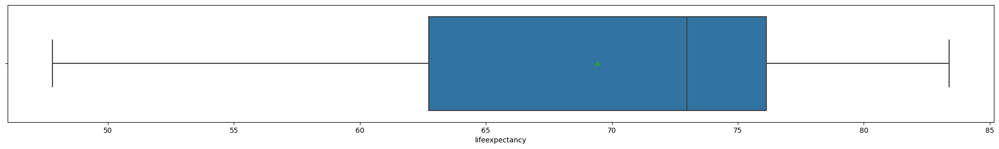

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["lifeexpectancy"] < (q1 - 1.5 * iqr)) | (gapminder_df["lifeexpectancy"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["lifeexpectancy"], showmeans=True, orient='h')

plt.show()

De acuerdo a la frecuencia y los datos intercuartilicos no se presenta datos poco comunes, para la variable lifeexpectancy mostranbdo una consistencia optima de entrenamiento

# Analisis numeros de nuevos casos de cancer, "breastcancerper100th"

In [ ]:
gapminder_df["breastcancerper100th"].nunique()

133

Con el analisis de valores sobre el dataset se visualiza que se cuentan con algunos valores iguales para ciertos paises, quiere decir que los numeros de cancer tienen una tendencia a ser igual

In [ ]:
gapminder_df["breastcancerper100th"].max()

101.1

In [ ]:
gapminder_df["breastcancerper100th"].min()

3.9

Con el minimo se deduce que se confirma que durante el año los numeros nuevos de casos de cancer siempre va aser positivo.

In [ ]:
gapminder_df["breastcancerper100th"].value_counts(dropna=False, normalize=True)

28.1     0.039326
19.5     0.028090
24.7     0.022472
13.2     0.022472
16.5     0.016854
           ...   
62.1     0.005618
12.3     0.005618
44.8     0.005618
50.9     0.005618
101.1    0.005618
Name: breastcancerper100th, Length: 134, dtype: float64

se presenta una tendencia a nivel general de que se aumenta en 28 unicades los numeros nuevos de cancer.

In [ ]:
gapminder_df["breastcancerper100th"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count    177.000000
mean      37.615254
std       23.225333
min        3.900000
5%        12.860000
25%       20.400000
50%       30.000000
75%       50.300000
95%       86.800000
max      101.100000
Name: breastcancerper100th, dtype: float64

In [ ]:
q1 = gapminder_df["breastcancerper100th"].quantile(0.25)
q3 = gapminder_df["breastcancerper100th"].quantile(0.75)
iqr = q3 - q1

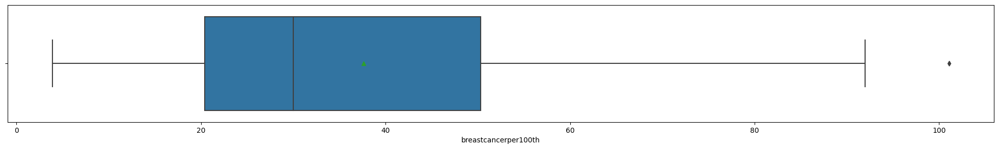

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["breastcancerper100th"] < (q1 - 1.5 * iqr)) | (gapminder_df["breastcancerper100th"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["breastcancerper100th"], showmeans=True, orient='h')

plt.show()

Los numeros de aumento de casos en el año son comunes presentandose un unico valor anomalo dentro del dataset.

# Analisis de consumo de energia residencial, "relectricperperson"

In [ ]:
gapminder_df["relectricperperson"].nunique()

129

El consumo de energia residencial tiende ser similar para algunos paises, presentandose la mayor cantidad de duplicidad en las variables analisadas.

In [ ]:
gapminder_df["relectricperperson"].max()

11154.75503

In [ ]:
gapminder_df["relectricperperson"].min()

0.0

El valor 0 puede presentarse por la falta de valores sobre el dataset, sin embargo es un dato importante a tener en cuenta debido a que sobre una vivienda siempre abra consumo de energia electrica por persona.

In [ ]:
gapminder_df["relectricperperson"].value_counts(dropna=False, normalize=True)

NaN            0.207865
2051.802338    0.011236
50.892101      0.011236
753.209802     0.011236
405.775385     0.011236
                 ...   
1494.410268    0.005618
261.433953     0.005618
815.031091     0.005618
1779.503510    0.005618
4542.848695    0.005618
Name: relectricperperson, Length: 130, dtype: float64

Se presentan valores vacios en mayor proporción, marcando un 20% de los datos, los cuales se debe validar la estrategia para ver si se elimina la variable o se normaliza con la media.

In [ ]:
gapminder_df["relectricperperson"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count      141.000000
mean      1181.715476
std       1655.388823
min          0.000000
5%          31.544564
25%        239.389457
50%        614.907287
75%       1566.106139
95%       4304.514402
max      11154.755030
Name: relectricperperson, dtype: float64

In [ ]:
q1 = gapminder_df["relectricperperson"].quantile(0.25)
q3 = gapminder_df["relectricperperson"].quantile(0.75)
iqr = q3 - q1

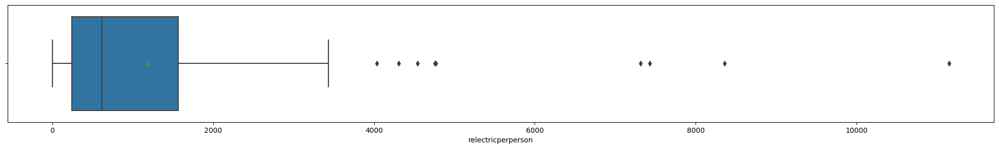

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["relectricperperson"] < (q1 - 1.5 * iqr)) | (gapminder_df["relectricperperson"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["relectricperperson"], showmeans=True, orient='h')

plt.show()

Se presentan datos anomalos, en algunos paises el consumo de energia es mayor por persona.

# Analisis de personas viviendo en areas urbanas, "urbanrate"


In [ ]:
gapminder_df["urbanrate"].nunique()

163

La cantidad de personas viviendo en areas urbanas tiende a ser valores diferentes en la mayoria del dataset

In [ ]:
gapminder_df["urbanrate"].max()

100.0

In [ ]:
gapminder_df["urbanrate"].min()

10.4

En todos los paises se evidencia que existe un porcentaje aunque sea bajo de personas viviendo en zonas urbanas.

In [ ]:
gapminder_df["urbanrate"].value_counts(dropna=False, normalize=True)

61.34    0.016854
82.44    0.011236
66.96    0.011236
26.46    0.011236
68.46    0.011236
           ...   
27.14    0.005618
28.38    0.005618
17.00    0.005618
72.84    0.005618
81.70    0.005618
Name: urbanrate, Length: 163, dtype: float64

Se presenta menos del 2% de valores duplicados para el porcentaje de personas que viven en zonas urbanas.

In [ ]:
gapminder_df["urbanrate"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count    178.000000
mean      56.282135
std       22.561796
min       10.400000
5%        18.283000
25%       36.965000
50%       59.600000
75%       73.460000
95%       91.711000
max      100.000000
Name: urbanrate, dtype: float64

In [ ]:
q1 = gapminder_df["urbanrate"].quantile(0.25)
q3 = gapminder_df["urbanrate"].quantile(0.75)
iqr = q3 - q1

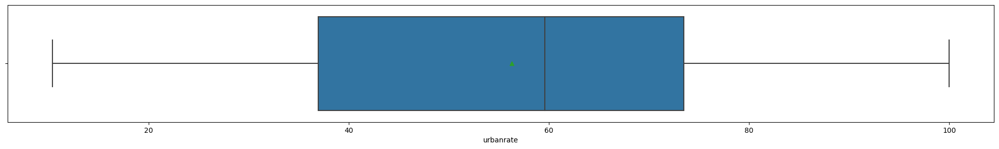

In [ ]:
# Filtrar los valores atípicos
outliers = gapminder_df[(gapminder_df["urbanrate"] < (q1 - 1.5 * iqr)) | (gapminder_df["urbanrate"] > (q3 + 1.5 * iqr))]

# Crear el boxplot
plt.figure(figsize=(25, 3))
sns.boxplot(x=gapminder_df["urbanrate"], showmeans=True, orient='h')

plt.show()

los valores del dataset muestran que el porcentaje de personas que viven en areas urbanas son consistentes y no se presentan valores anomalos.

In [ ]:
# Diccionario de mapeo de países a continentes
country_to_continent = {
    'Ireland': 'Europe',
    'Albania': 'Europe',
    'Central African Rep.': 'Africa',
    'Barbados': 'North America',
    'Italy': 'Europe',
    'Switzerland': 'Europe',
    'Mauritania': 'Africa',
    'Oman': 'Asia',
    'Tanzania': 'Africa',
    'Thailand': 'Asia',
    'Haiti': 'North America',
    'Equatorial Guinea': 'Africa',
    'Guatemala': 'North America',
    'Iraq': 'Asia',
    'Mali': 'Africa',
    'Bolivia': 'South America',
    'Kenya': 'Africa',
    'Panama': 'North America',
    'Macedonia, FYR': 'Europe',
    'Austria': 'Europe',
    'Fiji': 'Oceania',
    'Cuba': 'North America',
    'Azerbaijan': 'Asia',
    'Korea, Rep.': 'Asia',
    'Nicaragua': 'North America',
    'Lithuania': 'Europe',
    'Saudi Arabia': 'Asia',
    'Belarus': 'Europe',
    'Lesotho': 'Africa',
    'Cape Verde': 'Africa',
    'Eritrea': 'Africa',
    'Uganda': 'Africa',
    'South Africa': 'Africa',
    'Gabon': 'Africa',
    'Georgia': 'Asia',
    'Estonia': 'Europe',
    'Argentina': 'South America',
    'Cambodia': 'Asia',
    'Suriname': 'South America',
    'Gambia': 'Africa',
    'Japan': 'Asia',
    'Mozambique': 'Africa',
    'Norway': 'Europe',
    'Angola': 'Africa',
    'Yemen, Rep.': 'Asia',
    'Armenia': 'Asia',
    'Costa Rica': 'North America',
    'Turkey': 'Asia',
    'Moldova': 'Europe',
    'Pakistan': 'Asia',
    'Vietnam': 'Asia',
    'Spain': 'Europe',
    'Syria': 'Asia',
    'Uzbekistan': 'Asia',
    'Swaziland': 'Africa',
    'Croatia': 'Europe',
    'Solomon Islands': 'Oceania',
    'Ghana': 'Africa',
    'Finland': 'Europe',
    'Senegal': 'Africa',
    'Bangladesh': 'Asia',
    'Guyana': 'South America',
    'Ethiopia': 'Africa',
    'Russia': 'Asia',
    'Israel': 'Asia',
    'Malaysia': 'Asia',
    'Kuwait': 'Asia',
    'Malta': 'Europe',
    'Ecuador': 'South America',
    'Mongolia': 'Asia',
    'Kyrgyzstan': 'Asia',
    'Germany': 'Europe',
    'Rwanda': 'Africa',
    'China': 'Asia',
    'Burundi': 'Africa',
    'Slovak Republic': 'Europe',
    'Bahamas': 'North America',
    'Poland': 'Europe',
    'Iceland': 'Europe',
    'Papua New Guinea': 'Oceania',
    'Burkina Faso': 'Africa',
    'Venezuela': 'South America',
    'Morocco': 'Africa',
    'Zimbabwe': 'Africa',
    'Romania': 'Europe',
    'Brazil': 'South America',
    'Colombia': 'South America',
    'Botswana': 'Africa',
    'Bulgaria': 'Europe',
    'Congo, Dem. Rep.': 'Africa',
    'Madagascar': 'Africa',
    'India': 'Asia',
    'Togo': 'Africa',
    'Benin': 'Africa',
    'Luxembourg': 'Europe',
    'Sudan': 'Africa',
    'Peru': 'South America',
    'Afghanistan': 'Asia',
    'Egypt': 'Africa',
    'Portugal': 'Europe',
    'Australia': 'Oceania',
    'Cameroon': 'Africa',
    'Ukraine': 'Europe',
    'Congo, Rep.': 'Africa',
    'Jamaica': 'North America',
    'Chad': 'Africa',
    'Cyprus': 'Europe',
    'France': 'Europe',
    'Kazakhstan': 'Asia',
    'Dominican Rep.': 'North America',
    'Tajikistan': 'Asia',
    'Nepal': 'Asia',
    'Iran': 'Asia',
    'Singapore': 'Asia',
    'Slovenia': 'Europe',
    'Belgium': 'Europe',
    'New Zealand': 'Oceania',
    'Niger': 'Africa',
    'Sierra Leone': 'Africa',
    'Honduras': 'North America',
    'Trinidad and Tobago': 'North America',
    'Djibouti': 'Africa',
    'Guinea': 'Africa',
    'Denmark': 'Europe',
    'Algeria': 'Africa',
    'Belize': 'North America',
    'Hungary': 'Europe',
    'Brunei': 'Asia',
    'Myanmar': 'Asia',
    'Bosnia and Herzegovina': 'Europe',
    'Bahrain': 'Asia',
    'Sweden': 'Europe',
    'Uruguay': 'South America',
    'Malawi': 'Africa',
    'Liberia': 'Africa',
    'United Kingdom': 'Europe',
    "Cote d'Ivoire": 'Africa',
    'Jordan': 'Asia',
    'Paraguay': 'South America',
    'Libya': 'Africa',
    'Zambia': 'Africa',
    'Indonesia': 'Asia',
    'Turkmenistan': 'Asia',
    'Lebanon': 'Asia',
    'Philippines': 'Asia',
    'Sri Lanka': 'Asia',
    'Czech Rep.': 'Europe',
    'Bhutan': 'Asia',
    'United Arab Emirates': 'Asia',
    'Qatar': 'Asia',
    'Tunisia': 'Africa',
    'Guinea-Bissau': 'Africa',
    'Nigeria': 'Africa',
    'Timor-Leste': 'Asia',
    'Netherlands': 'Europe',
    'Greece': 'Europe',
    'El Salvador': 'North America',
    'Chile': 'South America',
    'Canada': 'North America',
    'Laos': 'Asia',
    'Latvia': 'Europe',
    'Mexico': 'North America',
    'Mauritius': 'Africa',
    'Namibia': 'Africa',
    'Comoros': 'Africa',
    'United States': 'North America',
}

# Función para asignar continentes a los países
def map_to_continent(country):
    return country_to_continent.get(country, 'Unknown')

# Crear la nueva columna 'continent'
gapminder_df['continent'] = gapminder_df['country'].apply(map_to_continent)

Se realiza una nueva columna con los continentes de cada pais.

# 2. Analisis exploratorio Bivariado

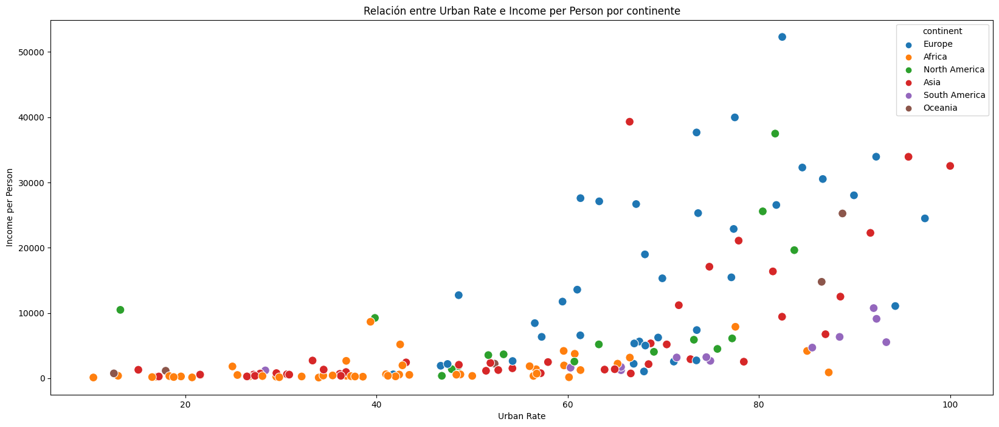

In [ ]:
# Scatter plot con colores por país
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='urbanrate', y='incomeperperson', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Urban Rate e Income per Person por continente')
plt.xlabel('Urban Rate')
plt.ylabel('Income per Person')

# Quitar el label del país del legend
#scatter_plot.legend().set_title('')
#scatter_plot.legend().set_visible(False)

# Mostrar el gráfico
plt.show()

El grafico muestra que entre mas alto es el porcentaje de personas que viven en areas urbanas, se presenta un mayor numero de PIB en los paises, es una tendencia, aunque hay un pais que no tiene mucho porcentaje en areas urbanas mantiene un PIB alto, "Se suprime la leyenda de los paises debido a que es muy grande y hace que no sea legible el grafico".

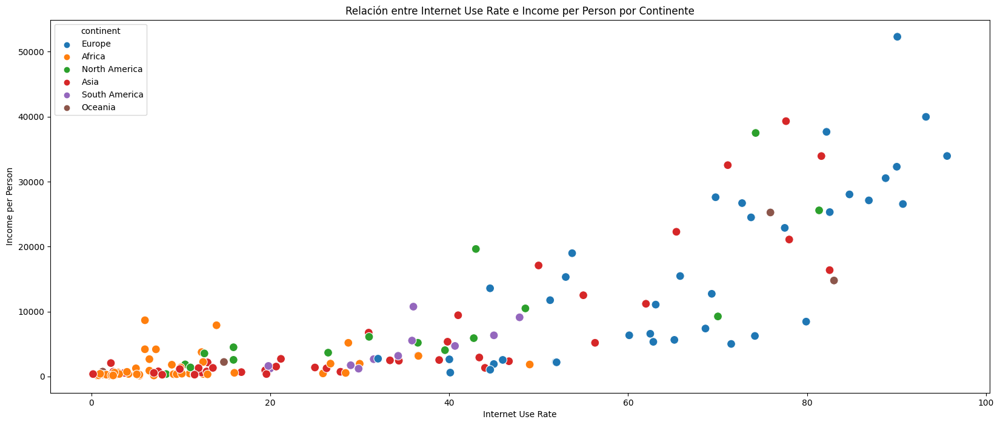

In [ ]:
# Scatter plot con colores por país
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='internetuserate', y='incomeperperson', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Internet Use Rate e Income per Person por Continente')
plt.xlabel('Internet Use Rate')
plt.ylabel('Income per Person')

# Mostrar el gráfico
plt.show()

El grafico muestra que entre mas alto es el porcentaje de personas que usan internet, asi como en el grafico anterior, se presenta un mayor numero de PIB en los paises, es una tendencia, aunque hay algunos valores que no cumplen muy bien con la tendencia, la mayoria de paises donde se usa mas el internet suele tenber un PIB alto, "Se suprime la leyenda de los paises debido a que es muy grande y hace que no sea legible el grafico".

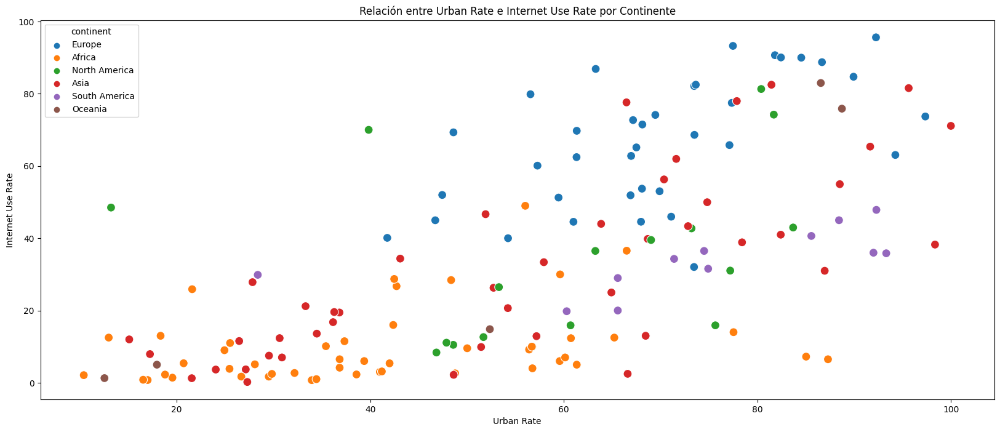

In [ ]:
# Scatter plot con colores por país, urbanrate e internetuserate
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='urbanrate', y='internetuserate', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Urban Rate e Internet Use Rate por Continente')
plt.xlabel('Urban Rate')
plt.ylabel('Internet Use Rate')

# Mostrar el gráfico
plt.show()



Es de esperar que si las dos variables tienden a ser parecidas con la variable objetivo entre elleas se deduzca que entre mas personas vivan en areas urbanas haya un porcentaje mayor de persocas que usan internet.

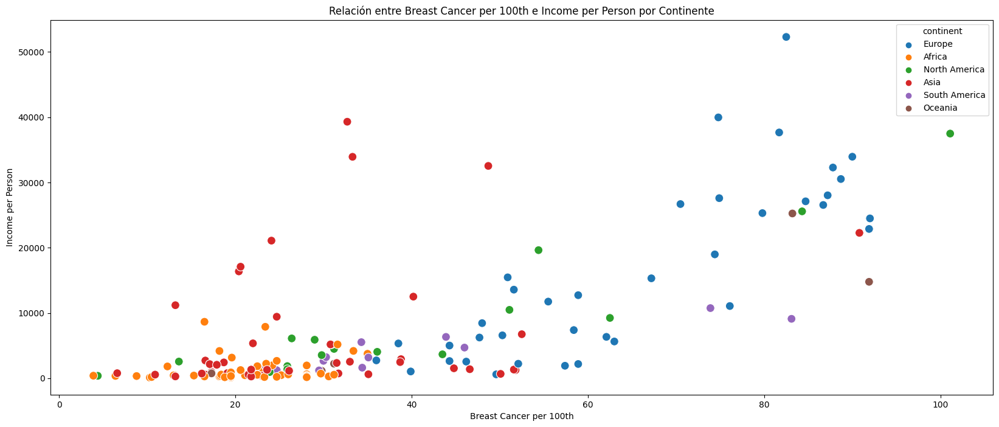

In [ ]:
# Scatter plot con colores por país, incomeperperson en el eje y y breastcancerper100th en el eje x
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='breastcancerper100th', y='incomeperperson', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Breast Cancer per 100th e Income per Person por Continente')
plt.xlabel('Breast Cancer per 100th')
plt.ylabel('Income per Person')

# Mostrar el gráfico
plt.show()


Seria interesante revisar el porque algunos paises que tienen el PIB alto no tienden a subir el porcentaje de cancer en las mujeres, alguna variable que maneje educación o quizas salud, esta practica se desarrolla mas que todos los paises del continente asiatico.

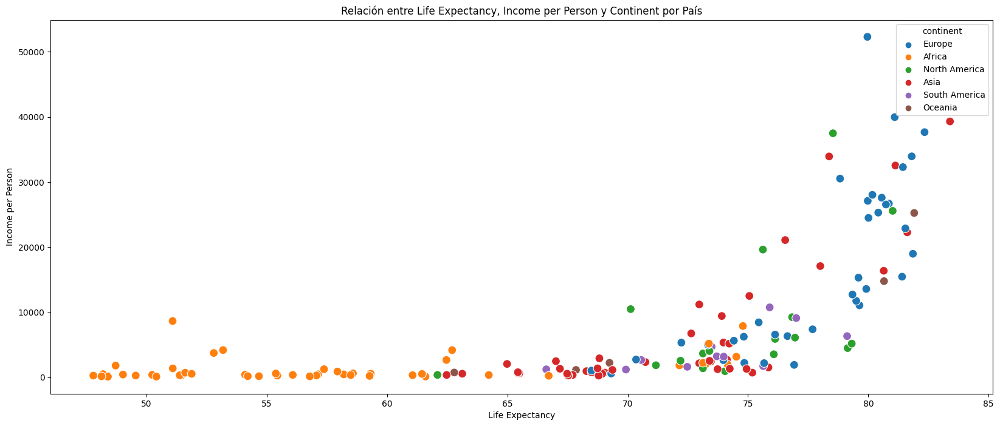

In [ ]:
# Scatter plot con colores por país, incomeperperson en el eje y, lifeexpectancy en el eje x y continente en color
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='lifeexpectancy', y='incomeperperson', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Life Expectancy, Income per Person y Continent por País')
plt.xlabel('Life Expectancy')
plt.ylabel('Income per Person')

# Mostrar el gráfico
plt.show()


El continente de africa no tiene una esperanza de vida alta, sin embargo, paises en el continente de Europa, Asia y North America mantienen una esperazna de vida mas optima, adicional de que tienen un PIB alto.

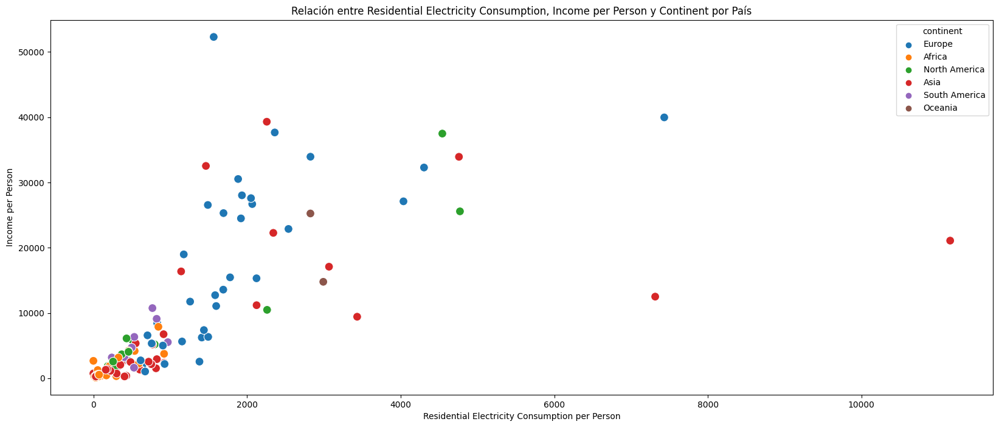

In [ ]:
# Scatter plot con colores por país, incomeperperson en el eje y, relectricperperson en el eje x y continente en color
plt.figure(figsize=(20, 8))
scatter_plot = sns.scatterplot(x='relectricperperson', y='incomeperperson', hue='continent', data=gapminder_df, palette='tab10', s=100)
plt.title('Relación entre Residential Electricity Consumption, Income per Person y Continent por País')
plt.xlabel('Residential Electricity Consumption per Person')
plt.ylabel('Income per Person')

# Mostrar el gráfico
plt.show()


Se presentan algunos valores anomalos en Asia y Europa, sin embargo, los paises que tienen mas alto el PIB tienden a realiza un consumo mayor de energia electrica por persona, entre mas alto el PIB se puede ir pensando que genera mas costos e inversiones en los paises.

## 2. Verificar y ajustar la calidad de los datos

In [ ]:
!pip install pylev
import re
from random import randint
from datetime import datetime
from difflib import SequenceMatcher
import numpy as np
import pandas as pd
import pylev

A continuación definimos unas variables para revisar valores duplicados con la variables features_country y la otra variable features se utilziara para valores nulos,

In [ ]:
features = ["incomeperperson", "alcconsumption", "armedforcesrate", "breastcancerper100th", "co2emissions", "femaleemployrate", "hivrate", "internetuserate", "lifeexpectancy", "oilperperson", "polityscore", "relectricperperson", "suicideper100th", "employrate", "urbanrate"]
features_country = ["country", "incomeperperson", "alcconsumption", "armedforcesrate", "breastcancerper100th", "co2emissions", "femaleemployrate", "hivrate", "internetuserate", "lifeexpectancy", "oilperperson", "polityscore", "relectricperperson", "suicideper100th", "employrate", "urbanrate"]

In [ ]:
duplicados = gapminder_df.loc[gapminder_df[features_country].duplicated(keep=False)]

In [ ]:
duplicados.shape

(24, 17)

In [ ]:
duplicados.sort_values(features_country, ascending=True).head(6)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate,continent
27,Belarus,2737.670379,18.85,3.711930,36.0,9.998743e+08,48.599998,0.3,32.052144,70.349,0.687828,-7.0,614.907287,26.874690,53.400002,73.46,Europe
148,Belarus,2737.670379,18.85,3.711930,36.0,9.998743e+08,48.599998,0.3,32.052144,70.349,0.687828,-7.0,614.907287,26.874690,53.400002,73.46,Europe
116,Iran,2161.546510,1.03,2.026400,17.1,9.183548e+09,26.900000,0.2,13.000111,72.974,1.162576,-7.0,753.209802,6.021882,47.799999,68.46,Asia
124,Iran,2161.546510,1.03,2.026400,17.1,9.183548e+09,26.900000,0.2,13.000111,72.974,1.162576,-7.0,753.209802,6.021882,47.799999,68.46,Asia
0,Ireland,27595.091350,14.92,0.450024,74.9,1.633779e+09,51.000000,0.2,69.770394,80.557,1.700262,10.0,2051.802338,10.365070,59.900002,61.34,Europe
155,Ireland,27595.091350,14.92,0.450024,74.9,1.633779e+09,51.000000,0.2,69.770394,80.557,1.700262,10.0,2051.802338,10.365070,59.900002,61.34,Europe


Luego de la validación se encuentra que se cuentan con 24 valores duplicados que coinciden en las 16 caracteristicas, a continuación se procede a imputar estos valores mediante la función drop_cuplicates

In [ ]:
gapminder_df = gapminder_df.drop_duplicates(subset=features_country)

In [ ]:
duplicados = gapminder_df.loc[gapminder_df[features_country].duplicated(keep=False)]

In [ ]:
duplicados.shape

(0, 17)

In [ ]:
gapminder_df.shape

(166, 17)

Luego de la eliminación de duplicados se cuenta con un dataset de 166 filas manteninedo las 16 caracteristicas.

Ahora se revisara la variable objetivo para realizar una limpieza de valores outliers al 80% debido al sus valores superiores para que no puedan impactar el aprendizaje del modelo.

In [ ]:
gapminder_df["incomeperperson"].describe(percentiles=[.25, .5, .75, .95, .99])

count      163.000000
mean      7202.019107
std      10469.295971
min        103.775857
25%        602.502870
50%       2344.896916
75%       8550.031767
95%      32116.462386
99%      39561.370946
max      52301.587180
Name: incomeperperson, dtype: float64

In [ ]:
gapminder_no_outliers_df = gapminder_df.loc[gapminder_df["incomeperperson"] <= gapminder_df["incomeperperson"].quantile(.7)]

Se toma el valor maximo del analisis intercuartilico para ajustar el dataframe a datos estables para el entrenamiento del modelo.

In [ ]:
gapminder_no_outliers_df.shape

(114, 17)

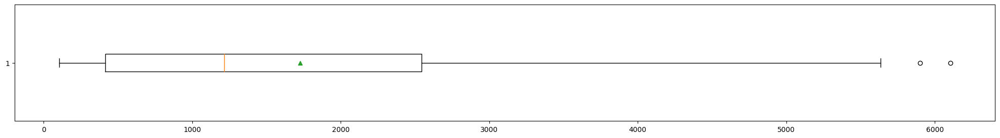

In [ ]:
plt.figure(figsize=(25, 3))
plt.boxplot(gapminder_no_outliers_df["incomeperperson"], showmeans=True, vert=False)
plt.show()

In [ ]:
gapminder_no_outliers_df[features].isnull().sum() / gapminder_no_outliers_df.shape[0]

incomeperperson         0.000000
alcconsumption          0.000000
armedforcesrate         0.035088
breastcancerper100th    0.008772
co2emissions            0.008772
femaleemployrate        0.008772
hivrate                 0.122807
internetuserate         0.017544
lifeexpectancy          0.000000
oilperperson            0.736842
polityscore             0.035088
relectricperperson      0.280702
suicideper100th         0.000000
employrate              0.008772
urbanrate               0.000000
dtype: float64

In [ ]:
features_training = ["alcconsumption", "breastcancerper100th",  "femaleemployrate", "internetuserate", "lifeexpectancy", "polityscore", "suicideper100th", "employrate", "urbanrate"]

Debido al porcentaje de valores nulos, se decide sacar la variable oilperperson, relectricperperson, co2emissions, armedforcesrate y hivrate de las variables de entrenamiento debido a que puede impactar el aprendizaje, adicional luego de varias iteraciones de entrenamiento del modelo, se descartan algunas variables debido a la poca correlación que presenta con la variable objetivo.

In [ ]:
# Llenar valores nulos con la media de cada columna
gapminder_df_filled = gapminder_no_outliers_df.fillna(gapminder_df.mean())

# Ahora puedes eliminar las filas que todavía tienen valores nulos si lo deseas
gapminder_df_cleaned = gapminder_df_filled.dropna()

gapminder_no_outliers_df = gapminder_df_cleaned

# Imprimir información sobre los valores nulos después de la limpieza
print("Valores nulos después de la limpieza:")
print(gapminder_df_cleaned.isnull().sum())


Valores nulos después de la limpieza:
country                 0
incomeperperson         0
alcconsumption          0
armedforcesrate         0
breastcancerper100th    0
co2emissions            0
femaleemployrate        0
hivrate                 0
internetuserate         0
lifeexpectancy          0
oilperperson            0
polityscore             0
relectricperperson      0
suicideper100th         0
employrate              0
urbanrate               0
continent               0
dtype: int64


<ipython-input-103-93eb1f995b36>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  gapminder_df_filled = gapminder_no_outliers_df.fillna(gapminder_df.mean())


Luego de suprimir las variables las cuales contenian mas valores nulos, se procede a ocupar los valores vacios de las variables con la media de cada variable, donde el porcentaje de valores vacios era bajo y no impactara el aprendizaje del modelo.

In [ ]:
gapminder_no_outliers_df[features_training].isnull().sum() / gapminder_no_outliers_df.shape[0]

alcconsumption          0.0
breastcancerper100th    0.0
femaleemployrate        0.0
internetuserate         0.0
lifeexpectancy          0.0
polityscore             0.0
suicideper100th         0.0
employrate              0.0
urbanrate               0.0
dtype: float64

In [ ]:
gapminder_no_outliers_df.shape

(114, 17)

<Figure size 1500x800 with 0 Axes>

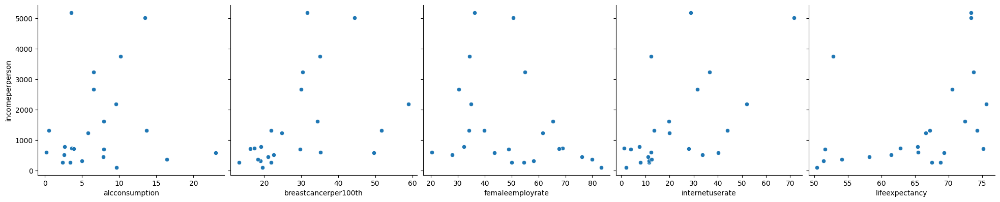

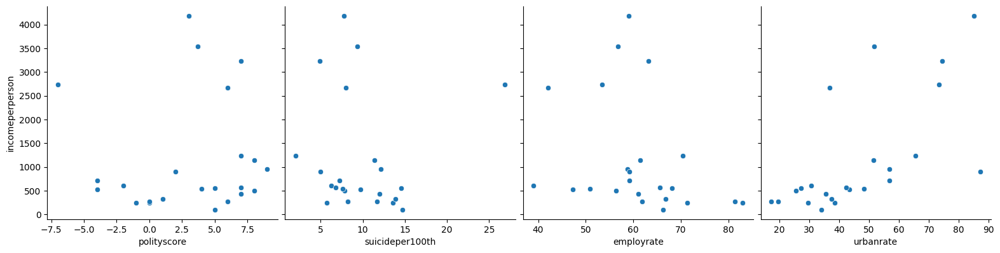

In [ ]:
# Calcula el número de filas necesario
num_rows = len(features_training) // 5
if len(features_training) % 5 != 0:
    num_rows += 1

# Crea el pair plot con 5 variables por fila
plt.figure(figsize=(15, 4 * num_rows))
for i in range(num_rows):
    start_idx = i * 5
    end_idx = (i + 1) * 5
    current_vars = features_training[start_idx:end_idx]

    pair_plot = sns.pairplot(gapminder_no_outliers_df.sample(frac=0.2), height=4, y_vars="incomeperperson", x_vars=current_vars, kind="scatter")

    # Ajusta las etiquetas de los ejes para la primera fila
    if i == 0:
        pair_plot.set(ylabel="incomeperperson")

plt.show()

Búsqueda de relaciones entre las variables de entrada, la mayoria tiene un crecimiento proporcional, algunas variables no estan distribuidas de manera similar al resto de las variables.

<Axes: >

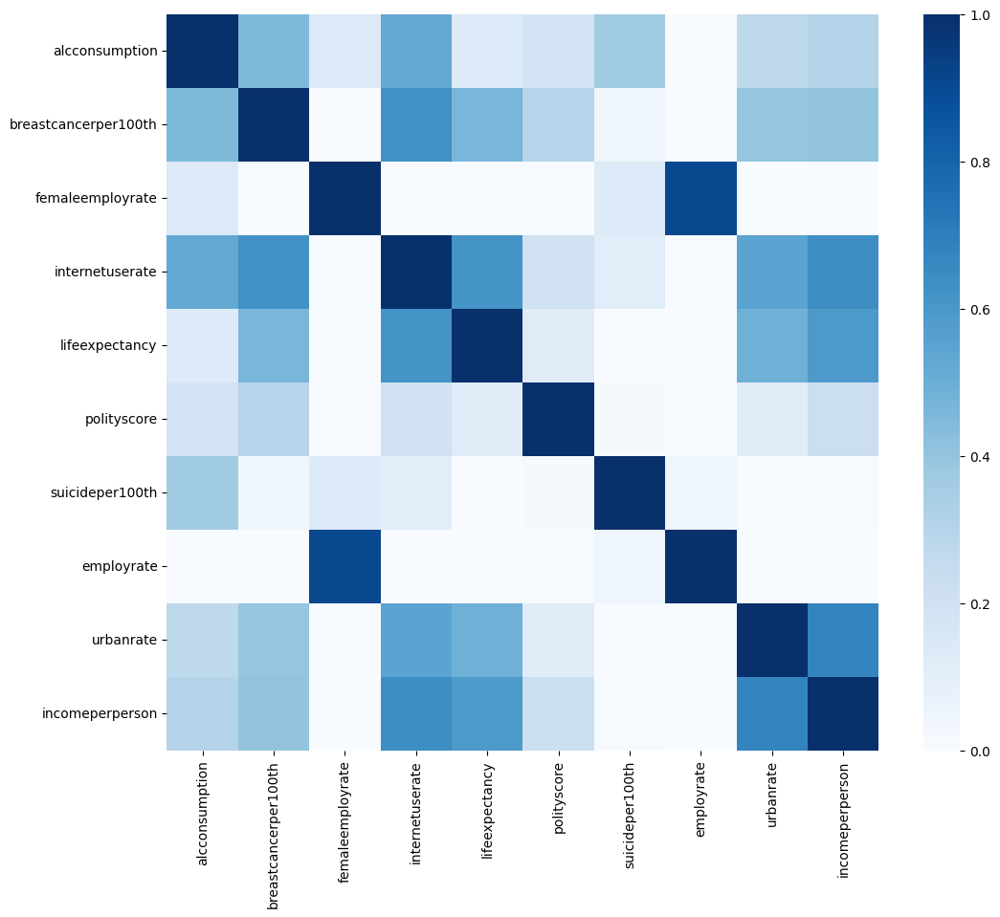

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(gapminder_no_outliers_df[features_training+["incomeperperson"]].corr(), cmap="Blues", vmin=0, vmax=1)

## Particionamiento del conjunto de datos en entrenamiento y prueba

Se desea construir un modelo que se ajuste bien a los datos de entrenamiento, pero que además se comporte de forma similar con datos previamente desconocidos.

Metodológicamente, una práctica común para validar esto es separando el conjunto de datos etiquetado en dos partes: entrenamiento y prueba. La proporción reservada para probar el modelo es definida por el analista, pero un valor común es 30%.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(gapminder_no_outliers_df[features_training], gapminder_no_outliers_df["incomeperperson"], test_size=0.3, random_state=1)

In [ ]:
X_train.shape, y_train.shape

((79, 9), (79,))

In [ ]:
X_test.shape, y_test.shape

((35, 9), (35,))

In [ ]:
gapminder_no_outliers_df.shape

(114, 17)

Entrenamiento de un primer modelo

In [ ]:
regression = LinearRegression()

In [ ]:
regression.fit(X_train, y_train)

LinearRegression()

In [ ]:
pd.DataFrame({"columns": features_training, "coef": regression.coef_})

,columns,coef
0,alcconsumption,69.774452
1,breastcancerper100th,-6.456949
2,femaleemployrate,-16.080288
3,internetuserate,18.000608
4,lifeexpectancy,30.694034
5,polityscore,23.280262
6,suicideper100th,-14.426199
7,employrate,10.613633
8,urbanrate,35.939792


In [ ]:
regression.intercept_

-2309.266182732675

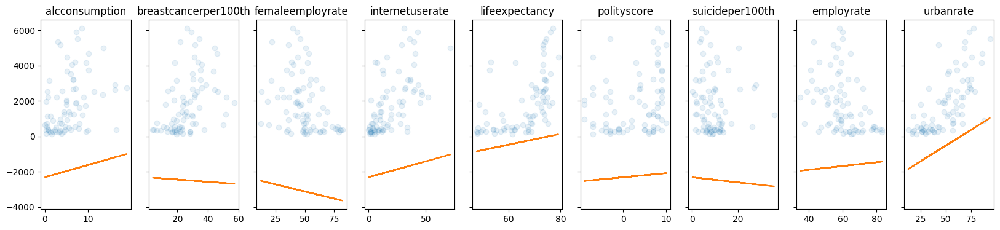

In [ ]:
f, axs = plt.subplots(1, len(features_training), sharey=True, figsize=(20, 4))

for i in range(len(features_training)):
    col = features_training[i]
    x = X_train[col]
    m = regression.coef_[i]
    b = regression.intercept_

    axs[i].plot(x, y_train, "o", alpha=0.1)
    axs[i].plot(x, x * m + b)
    axs[i].set_title(col)

In [ ]:
print("Train:", mean_absolute_error(y_train, regression.predict(X_train)))
print("Test:", mean_absolute_error(y_test, regression.predict(X_test)))

Train: 774.6158481116574
Test: 870.7097154515723


In [ ]:
print("Train:", np.sqrt(mean_squared_error(y_train, regression.predict(X_train))))
print("Test:", np.sqrt(mean_squared_error(y_test, regression.predict(X_test))))

Train: 1011.3939277639445
Test: 1130.5986942072575


A continuación vamos aplicar regularización de los datos de entrenamiento para evaluar si se presenta un mejor modelo.

In [ ]:
scaler = StandardScaler()

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
regression = LinearRegression()

In [ ]:
regression.fit(X_train_scaled, y_train)

LinearRegression()

In [ ]:
coefficients_df = pd.concat([
    pd.Series(features_training),
    pd.Series(regression.coef_)
], axis=1).rename(columns={0: "feature", 1: "value"})
coefficients_df

,feature,value
0,alcconsumption,287.562991
1,breastcancerper100th,-72.678830
2,femaleemployrate,-253.729601
3,internetuserate,277.706883
4,lifeexpectancy,276.241880
5,polityscore,134.753702
6,suicideper100th,-90.987410
7,employrate,115.859962
8,urbanrate,708.475041


In [ ]:
regression.intercept_

1848.0764073063285

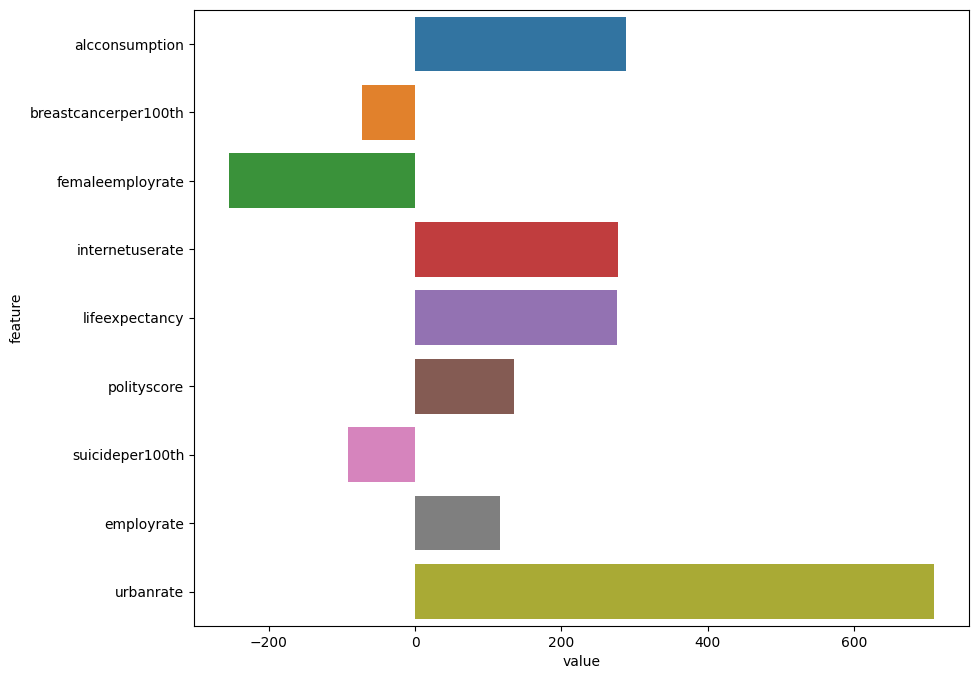

In [ ]:
plt.figure(figsize=(10, 8))
sns.barplot(
    y=coefficients_df["feature"],
    x=coefficients_df["value"],
    orient="h"
)
plt.show()

Muestra grafica y distribución del valor de los coeficientes para cada variable utilizada en el modelo de entrenamiento.

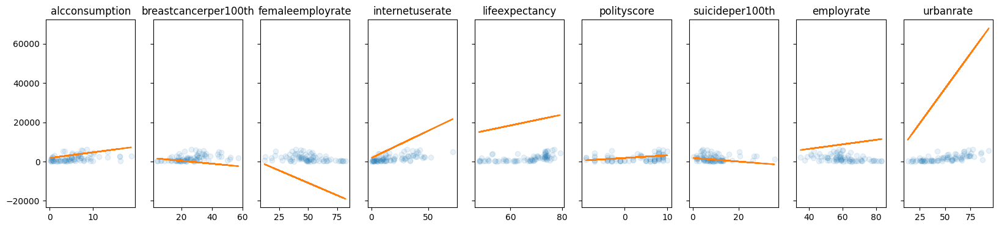

In [ ]:
f, axs = plt.subplots(1, len(features_training), sharey=True, figsize=(20, 4))

for i in range(len(features_training)):
    col = features_training[i]
    x = X_train[col]
    m = regression.coef_[i]
    b = regression.intercept_

    axs[i].plot(x, y_train, "o", alpha=0.1)
    axs[i].plot(x, x * m + b)
    axs[i].set_title(col)

In [ ]:
print("Train:", mean_absolute_error(y_train, regression.predict(X_train_scaled)))
print("Test:", mean_absolute_error(y_test, regression.predict(X_test_scaled)))

Train: 774.6158481116577
Test: 870.7097154515728


In [ ]:
print("Train:", np.sqrt(mean_squared_error(y_train, regression.predict(X_train_scaled))))
print("Test:", np.sqrt(mean_squared_error(y_test, regression.predict(X_test_scaled))))

Train: 1011.3939277639444
Test: 1130.598694207258


Revisando ambos errores presentados en el entranamiento con regularización y sin regularización no cambian los errores en como se presentan, sin embargo, el intercepto toma un valor diferente, un valor de 1130 en la varianza del valor entregado dependiendo el pais evaluado puede considerarse como alto o puede considerarse bajo, es un valor que puede tener vaias implicaciones en el analisis del entrenamiento.

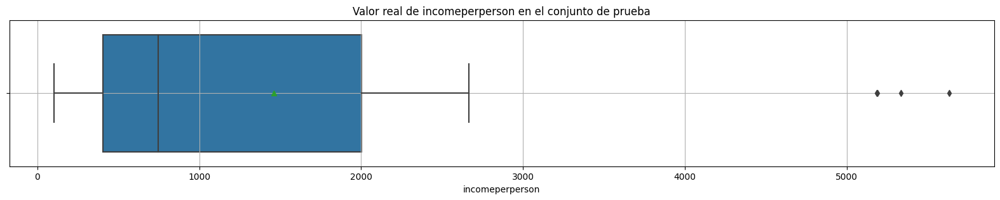

In [ ]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=y_test, showmeans=True, orient="h")
plt.title("Valor real de incomeperperson en el conjunto de prueba")
plt.grid()
plt.show()

El valor del PIB en el conjunto de datos de prueba mantiene algunos valores atipicos los cuales pueden tener o impactar en el valor del error para el entrenamiento.

In [ ]:
y_test.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

count      35.000000
mean     1458.551976
std      1592.679668
min       103.775857
25%       404.633018
50%       744.239413
75%      2002.948769
99%      5531.403727
max      5634.003948
Name: incomeperperson, dtype: float64

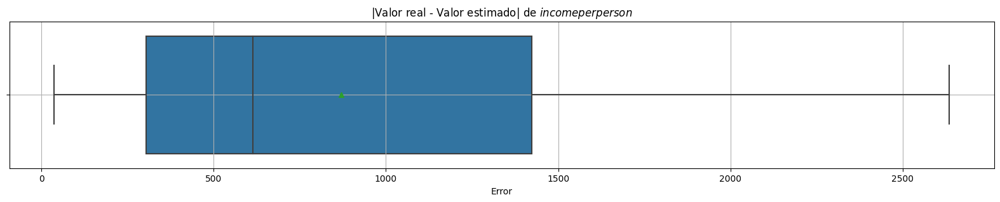

In [ ]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=abs(y_test - regression.predict(X_test_scaled)), showmeans=True, orient="h")
plt.title("|Valor real - Valor estimado| de $\t{incomeperperson}$")
plt.xlabel("Error")
plt.grid()
plt.show()

In [ ]:
abs(y_test-regression.predict(X_test_scaled)).describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count      35.000000
mean      870.709715
std       731.720976
min        36.921986
25%       304.440395
50%       612.900747
75%      1422.659235
95%      2340.140945
99%      2576.741791
max      2635.873051
Name: incomeperperson, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import scipy.stats as stats

## Supuestos

Colinealidad

<Axes: >

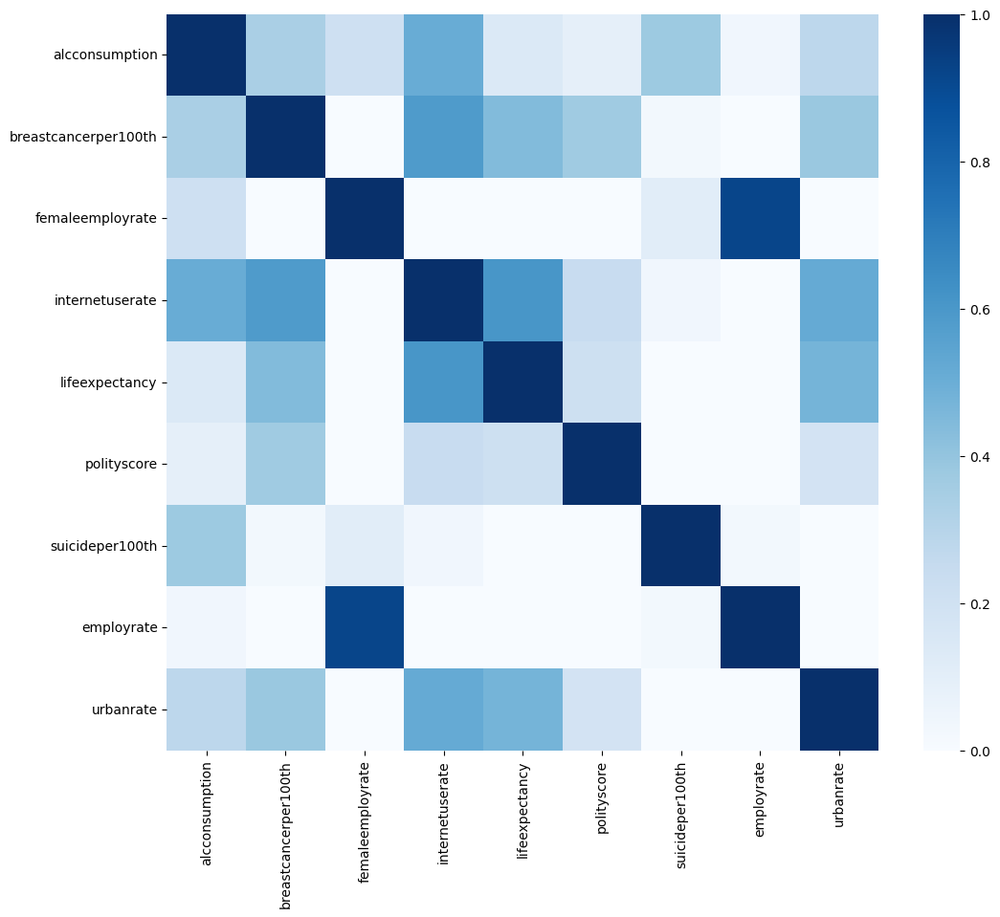

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(X_train.corr(), cmap="Blues", vmin=0, vmax=1)

In [ ]:
X_train.corr()

,alcconsumption,breastcancerper100th,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate
alcconsumption,1.000000,0.336939,0.207946,0.508745,0.143736,0.092941,0.376961,0.035538,0.277935
breastcancerper100th,0.336939,1.000000,-0.383688,0.584725,0.441551,0.370674,0.026286,-0.397404,0.386648
femaleemployrate,0.207946,-0.383688,1.000000,-0.293776,-0.378572,-0.163528,0.111532,0.919799,-0.400875
internetuserate,0.508745,0.584725,-0.293776,1.000000,0.608798,0.238793,0.038988,-0.390461,0.517999
lifeexpectancy,0.143736,0.441551,-0.378572,0.608798,1.000000,0.213126,-0.128167,-0.323402,0.474170
polityscore,0.092941,0.370674,-0.163528,0.238793,0.213126,1.000000,-0.091581,-0.157246,0.187389
suicideper100th,0.376961,0.026286,0.111532,0.038988,-0.128167,-0.091581,1.000000,0.026796,-0.101593
employrate,0.035538,-0.397404,0.919799,-0.390461,-0.323402,-0.157246,0.026796,1.000000,-0.436556
urbanrate,0.277935,0.386648,-0.400875,0.517999,0.474170,0.187389,-0.101593,-0.436556,1.000000


Ninguna variable mantiene una correlación del 90% o superior.

Linealidad

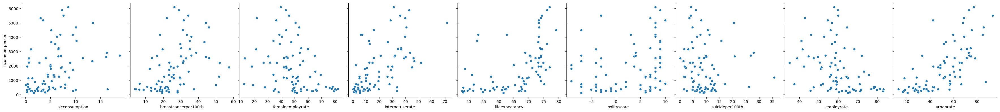

In [ ]:
sns.pairplot(pd.concat([X_train, y_train], axis=1), height=4, y_vars="incomeperperson", x_vars=features_training, kind="scatter")

Es necesario que la relación entre cada variable de entrada y la varable objetivo sea lineal.

pudee que incomeperperson no tenga una relación lineal con algunas variables tomadas para el entrenamiento, se va a validar con un entrenamiento polinomial.

La forma más común de comprobarlo es agregar una transformación polinomial (PolynomialFeatures) de algún grado integrada al Pipeline. Tenga en cuenta que la transformación se aplicará a todas las variables de entrada y será labor del algoritmo de regresión determinar cuáles son las más relevantes para la estimación.


In [ ]:
pipeline = Pipeline(
    [
        ("poly", PolynomialFeatures(degree=2, include_bias=False)),
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [ ]:
pipeline.fit(X_train[features_training], y_train)

Pipeline(steps=[('poly', PolynomialFeatures(include_bias=False)),
                ('scaler', StandardScaler()), ('model', LinearRegression())])

In [ ]:
pd.DataFrame({"columns": pipeline["poly"].get_feature_names_out(), "coef": pipeline["model"].coef_})

,columns,coef
0,alcconsumption,2714.004806
1,breastcancerper100th,-2351.266608
2,femaleemployrate,-1070.238382
3,internetuserate,-3906.102348
4,lifeexpectancy,-2560.057956
5,polityscore,-686.683998
6,suicideper100th,-900.842236
7,employrate,-2224.889587
8,urbanrate,-1697.485591
9,alcconsumption^2,-704.089877


In [ ]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train[features_training])))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test[features_training])))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train[features_training]))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test[features_training]))))

MAE:
Train: 363.0631872325259
Test: 1329.6600198208196

RMSE:
Train: 464.3896198340494
Test: 1679.5814343714105


Entre mas se aumenta el grado del polinomio de entrenamiento se empieza a presentar un overfitting muy marcado sobre el modelo de machine learning, lo que nos deduce que es mejor mantener un entrenamiento lineal, para que asi el modelo a datos nuevos no presente un error muy desfasado.

Normalidad de los errores

In [ ]:
pipeline = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [ ]:
pipeline.fit(X_train[features_training], y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [ ]:
errors = (pipeline.predict(X_train[features_training])-y_train).values

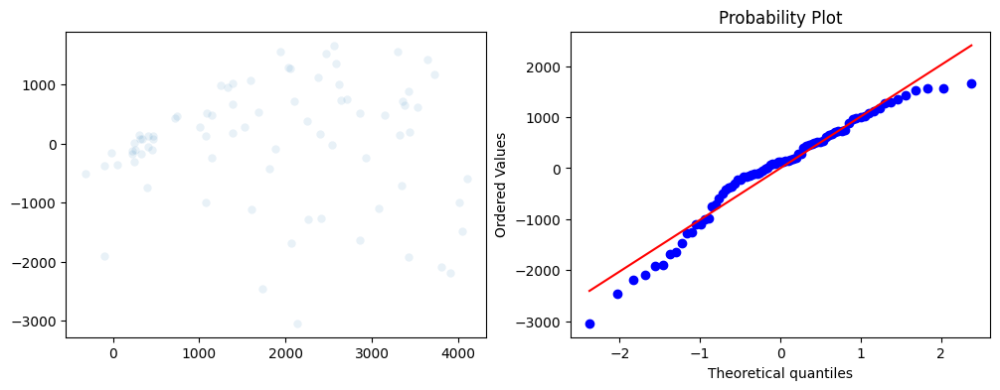

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline.predict(X_train[features_training]), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

La variable errors contiene los errores residuales del modelo de regresión. Cada valor en errors representa cuánto difiere la predicción del modelo del valor real correspondiente en el conjunto de entrenamiento.

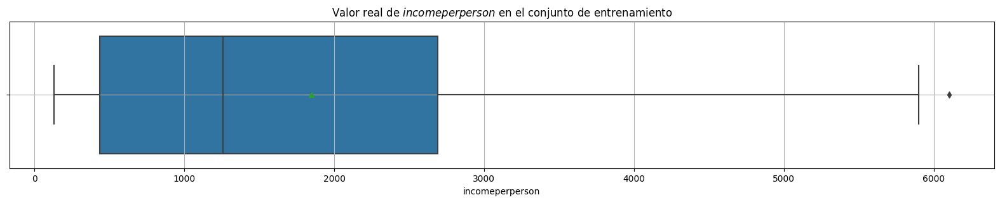

In [ ]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=y_train, showmeans=True, orient="h")
plt.title("Valor real de $\t{incomeperperson}$ en el conjunto de entrenamiento")
plt.grid()
plt.show()

In [ ]:
q1 = y_train.quantile(0.25)
q3 = y_train.quantile(0.75)
iqr = q3-q1
threshold = q3+1.5*iqr
threshold

6074.756778249999

In [ ]:
y_train = y_train.loc[y_train <= threshold]
X_train = X_train.loc[y_train.index]

In [ ]:
y_test = y_test.loc[y_test <= threshold]
X_test = X_test.loc[y_test.index]

In [ ]:
pipeline.fit(X_train[features_training], y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [ ]:
pd.DataFrame({"columns": features_training, "coef": pipeline["model"].coef_})

,columns,coef
0,alcconsumption,227.465180
1,breastcancerper100th,-20.700071
2,femaleemployrate,-122.230002
3,internetuserate,280.430412
4,lifeexpectancy,256.932677
5,polityscore,106.758772
6,suicideper100th,-65.508074
7,employrate,0.255065
8,urbanrate,676.499659


In [ ]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train[features_training])))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test[features_training])))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train[features_training]))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test[features_training]))))

MAE:
Train: 746.116957112876
Test: 852.6111302578571

RMSE:
Train: 983.7923131705741
Test: 1116.4586829652449


In [ ]:
errors = (pipeline.predict(X_train[features_training])-y_train).values

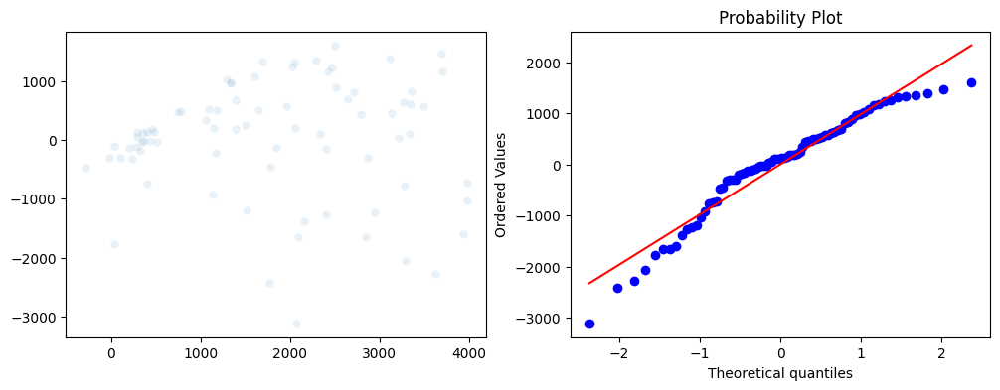

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline.predict(X_train[features_training]), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

Luego de ajustar las variables para no seleccionar valores atipico o anomalos se siguen presentando errores en las graficas.

Varianza constante (Homocedasticidad)

<Axes: >

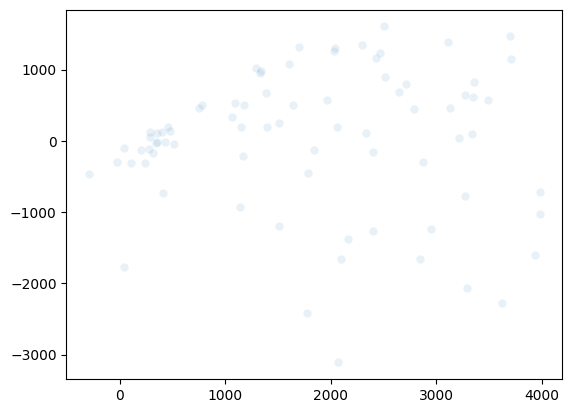

In [ ]:
sns.scatterplot(x = pipeline.predict(X_train[features_training]), y=errors, alpha=0.1)

La varianza en el error se presenta mas alta cuando los valores de las variables tomadas para el entrenamiento incrementan, este valor se presenta luego de varias estrategias de normalización.